Alunos: Gabriel Moura e Juan Melo

Instalação de dependências necessárias.

In [ ]:
!pip install -q --upgrade diffusers transformers peft accelerate datasets ftfy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 494.8/494.8 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Imports de módulos que serão utilizados e configurações básicas.

In [ ]:
import os
import random
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import display

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torch.optim import AdamW

from torchvision import transforms
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize

from datasets import load_dataset
from diffusers import (
    StableDiffusionPipeline, UNet2DConditionModel,
    AutoencoderKL, DDPMScheduler
)
from transformers import (
    CLIPTextModel, CLIPTokenizer,
    CLIPModel, get_scheduler
)
from peft import LoraConfig, get_peft_model, PeftModel


#Configurações básicas
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mixed_precision = "fp16"

seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Função para fazer o pŕe-processamento das imagens da base de dados.

In [ ]:
def preprocess_images(input_dir, output_dir, size=512):
    os.makedirs(output_dir, exist_ok=True)
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.CenterCrop(size),
        transforms.ToTensor()
    ])
    count = 0
    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.png', '.jpeg', '.webp')):
                try:
                    img = Image.open(os.path.join(root, file)).convert("RGB")
                    img_tensor = transform(img)
                    img_out = transforms.ToPILImage()(img_tensor)
                    img_out.save(f"{output_dir}/{str(count).zfill(4)}.png")
                    count += 1
                except Exception as e:
                    print(f"Erro processando {file}: {e}")
    print(f"✅ {count} imagens prontas para treinamento.")

Chamando a função e definindo o diretório onde serão salvas as novas imagens.

In [ ]:
input_dir = "database"
output_dir = "/content/processed_images"
preprocess_images(input_dir, output_dir)

✅ 31 imagens prontas para treinamento.


Classe para criar o dataset personalizado.

In [ ]:
class MangaDataset(Dataset):
    def __init__(self, image_dir, metadata_path, tokenizer, image_size=512):
        self.image_dir = image_dir
        self.tokenizer = tokenizer
        self.image_size = image_size
        df = pd.read_csv(metadata_path)
        self.samples = df.to_dict(orient="records")
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(degrees=5),
            transforms.ColorJitter(brightness=0.1, contrast=0.1),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]
        image_path = os.path.join(self.image_dir, sample["filename"])
        prompt = sample["prompt"]
        image = Image.open(image_path).convert("RGB")
        image = self.transform(image)
        input_ids = self.tokenizer(prompt, truncation=True, padding="max_length",
                                   max_length=self.tokenizer.model_max_length, return_tensors="pt").input_ids[0]
        return {"pixel_values": image, "input_ids": input_ids}

Definição do CLIP para avaliação e de uma função auxiliar.

In [ ]:
clip_preprocess = Compose([
    Resize(224, interpolation=transforms.InterpolationMode.BICUBIC),
    CenterCrop(224),
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073),
              (0.26862954, 0.26130258, 0.27577711))
])

@torch.no_grad()
def evaluate_clip_score(prompt, image_pil, clip_model, tokenizer):
    image_input = clip_preprocess(image_pil).unsqueeze(0).to(device)
    text_input = tokenizer(prompt, return_tensors="pt").input_ids.to(device)
    image_embeds = clip_model.get_image_features(pixel_values=image_input)
    text_embeds = clip_model.get_text_features(input_ids=text_input)
    image_embeds = F.normalize(image_embeds, dim=-1)
    text_embeds = F.normalize(text_embeds, dim=-1)
    return torch.matmul(image_embeds, text_embeds.T).item()

def collate_fn(batch):
    pixel_values = torch.stack([item['pixel_values'] for item in batch])
    input_ids = torch.stack([item['input_ids'] for item in batch])
    return {'pixel_values': pixel_values, 'input_ids': input_ids}

Função para setup do modelo.

In [ ]:
def setup_models(lora_config):
    clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
    tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
    text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14").to(device)

    vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to(device)
    unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet").to(device)

    unet = get_peft_model(unet, lora_config)
    scheduler = DDPMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

    return clip_model, tokenizer, text_encoder, vae, unet, scheduler

Função para o treinamento do modelo.

In [ ]:
def train_model(epochs, image_dir, metadata_path, model_name, lora_config):
    clip_model, tokenizer, text_encoder, vae, unet, scheduler = setup_models(lora_config)
    dataset = MangaDataset(image_dir, metadata_path, tokenizer)
    dataloader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)

    optimizer = AdamW(unet.parameters(), lr=5e-5)
    total_steps = len(dataloader) * epochs // 4
    scheduler_lr = get_scheduler("cosine", optimizer=optimizer, num_warmup_steps=100, num_training_steps=total_steps)
    scaler = torch.cuda.amp.GradScaler(enabled=mixed_precision == "fp16")

    train_losses, clip_scores, generated_images = [], [], []

    for epoch in range(epochs):
        print(f"\n🌟 Epoch {epoch + 1}/{epochs}")
        epoch_loss = 0
        for step, batch in enumerate(tqdm(dataloader)):
            with torch.cuda.amp.autocast(enabled=mixed_precision == "fp16"):
                images = batch['pixel_values'].to(device)
                input_ids = batch['input_ids'].to(device)
                with torch.no_grad():
                    latents = vae.encode(images).latent_dist.sample() * 0.18215
                noise = torch.randn_like(latents)
                timesteps = torch.randint(0, 1000, (latents.size(0),), device=device).long()
                noisy_latents = scheduler.add_noise(latents, noise, timesteps)
                with torch.no_grad():
                    encoder_hidden_states = text_encoder(input_ids).last_hidden_state
                noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample
                loss = F.mse_loss(noise_pred, noise) / 4

            scaler.scale(loss).backward()
            if (step + 1) % 4 == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad(set_to_none=True)
                scheduler_lr.step()
            epoch_loss += loss.item()

        avg_loss = epoch_loss / len(dataloader)
        train_losses.append(avg_loss)
        print(f"📉 Loss média: {avg_loss:.6f}")

        if (epoch + 1) % 5 == 0:
            print(f"🖼️ Gerando imagem para avaliação (Epoch {epoch+1})...")
            pipe = StableDiffusionPipeline.from_pretrained(
                "CompVis/stable-diffusion-v1-4", vae=vae, text_encoder=text_encoder,
                tokenizer=tokenizer, unet=unet, safety_checker=None, torch_dtype=torch.float16
            ).to(device)

            prompt = "manga character with sword, dynamic pose, tite kubo style"
            image = pipe(prompt, num_inference_steps=30).images[0]
            score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
            clip_scores.append(score)
            generated_images.append(image)
            print(f"🔎 CLIP Score da imagem gerada: {score:.4f}")

    output_dir = f"/content/{model_name}"
    unet.save_pretrained(output_dir)
    print(f"✅ Pesos salvos em {output_dir}")

    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label="Loss", marker='o')
    plt.plot(range(4, epochs, 5), clip_scores, label="CLIP Score", marker='s')
    plt.title("Treinamento - Loss vs CLIP Score")
    plt.xlabel("Epoch")
    plt.legend()
    plt.grid(True)
    plt.show()

    for i, img in enumerate(generated_images):
        display(img)
        print(f"Epoch {5*(i+1)} - CLIP Score: {clip_scores[i]:.4f}")


Configuração do Lora para o primeiro modelo, com o objetivo de ser um modelo mais leve.

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

/tmp/ipython-input-8-2405558981.py:9: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=mixed_precision == "fp16")



🌟 Epoch 1/15


  0%|          | 0/16 [00:00<?, ?it/s]/tmp/ipython-input-8-2405558981.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=mixed_precision == "fp16"):
100%|██████████| 16/16 [00:13<00:00,  1.15it/s]


📉 Loss média: 0.025743

🌟 Epoch 2/15


100%|██████████| 16/16 [00:11<00:00,  1.42it/s]


📉 Loss média: 0.019505

🌟 Epoch 3/15


100%|██████████| 16/16 [00:11<00:00,  1.41it/s]


📉 Loss média: 0.020187

🌟 Epoch 4/15


100%|██████████| 16/16 [00:11<00:00,  1.42it/s]


📉 Loss média: 0.027145

🌟 Epoch 5/15


100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


📉 Loss média: 0.020701
🖼️ Gerando imagem para avaliação (Epoch 5)...


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2579

🌟 Epoch 6/15


100%|██████████| 16/16 [00:11<00:00,  1.45it/s]


📉 Loss média: 0.026292

🌟 Epoch 7/15


100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


📉 Loss média: 0.028858

🌟 Epoch 8/15


100%|██████████| 16/16 [00:11<00:00,  1.43it/s]


📉 Loss média: 0.026268

🌟 Epoch 9/15


100%|██████████| 16/16 [00:11<00:00,  1.43it/s]


📉 Loss média: 0.025071

🌟 Epoch 10/15


100%|██████████| 16/16 [00:11<00:00,  1.43it/s]

📉 Loss média: 0.019192
🖼️ Gerando imagem para avaliação (Epoch 10)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2991

🌟 Epoch 11/15


100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


📉 Loss média: 0.029112

🌟 Epoch 12/15


100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


📉 Loss média: 0.028227

🌟 Epoch 13/15


100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


📉 Loss média: 0.027876

🌟 Epoch 14/15


100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


📉 Loss média: 0.015574

🌟 Epoch 15/15


100%|██████████| 16/16 [00:11<00:00,  1.43it/s]

📉 Loss média: 0.024346
🖼️ Gerando imagem para avaliação (Epoch 15)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2747
✅ Pesos salvos em /content/lora-kubo-v1


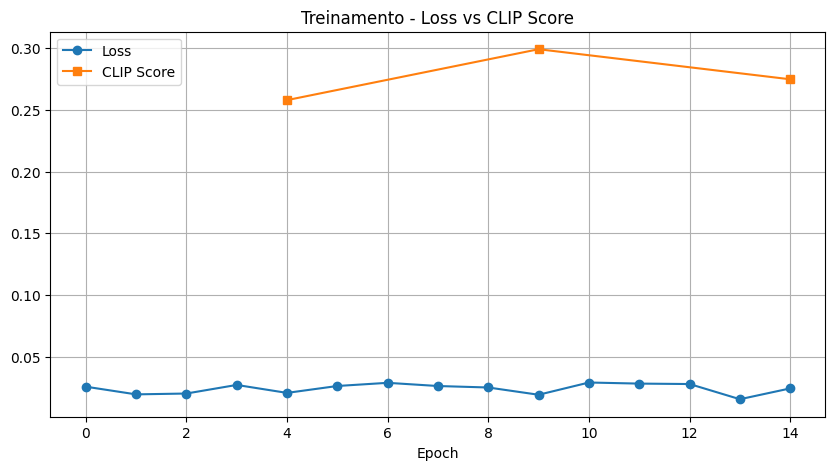

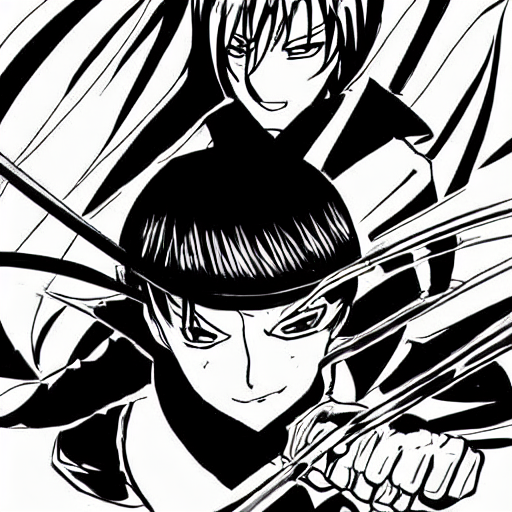

Epoch 5 - CLIP Score: 0.2579


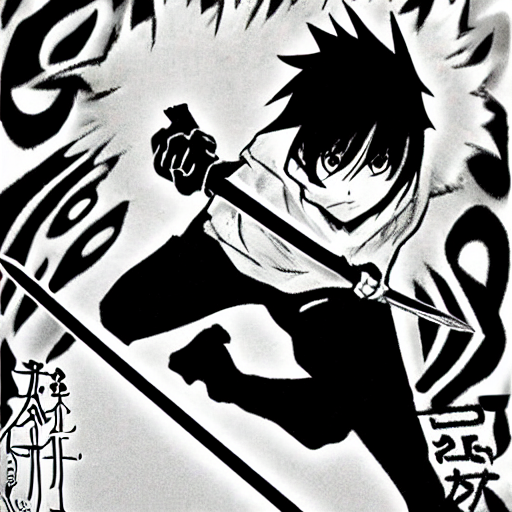

Epoch 10 - CLIP Score: 0.2991


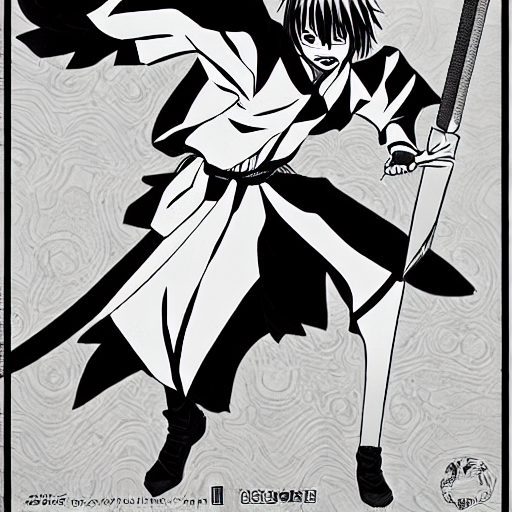

Epoch 15 - CLIP Score: 0.2747


In [ ]:
lora_v1 = LoraConfig(
    r=4, lora_alpha=8,
    target_modules=["to_q", "to_k", "to_v", "to_out.0"],
    bias="none"
)
train_model(15, "/content/processed_images", "/content/prompts.csv", "lora-kubo-v1", lora_v1)

Configuração do Lora para o segundo modelo, mais robusto que o anterior.

/tmp/ipython-input-8-2405558981.py:9: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=mixed_precision == "fp16")



🌟 Epoch 1/30


  0%|          | 0/16 [00:00<?, ?it/s]/tmp/ipython-input-8-2405558981.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=mixed_precision == "fp16"):
100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.022169

🌟 Epoch 2/30


100%|██████████| 16/16 [00:11<00:00,  1.36it/s]


📉 Loss média: 0.025379

🌟 Epoch 3/30


100%|██████████| 16/16 [00:11<00:00,  1.35it/s]


📉 Loss média: 0.023433

🌟 Epoch 4/30


100%|██████████| 16/16 [00:11<00:00,  1.36it/s]


📉 Loss média: 0.020309

🌟 Epoch 5/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]

📉 Loss média: 0.016651
🖼️ Gerando imagem para avaliação (Epoch 5)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2736

🌟 Epoch 6/30


100%|██████████| 16/16 [00:11<00:00,  1.38it/s]


📉 Loss média: 0.016183

🌟 Epoch 7/30


100%|██████████| 16/16 [00:11<00:00,  1.38it/s]


📉 Loss média: 0.019810

🌟 Epoch 8/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.022883

🌟 Epoch 9/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.025954

🌟 Epoch 10/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]

📉 Loss média: 0.026217
🖼️ Gerando imagem para avaliação (Epoch 10)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2853

🌟 Epoch 11/30


100%|██████████| 16/16 [00:11<00:00,  1.38it/s]


📉 Loss média: 0.016488

🌟 Epoch 12/30


100%|██████████| 16/16 [00:11<00:00,  1.38it/s]


📉 Loss média: 0.031420

🌟 Epoch 13/30


100%|██████████| 16/16 [00:11<00:00,  1.38it/s]


📉 Loss média: 0.027436

🌟 Epoch 14/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.022073

🌟 Epoch 15/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]

📉 Loss média: 0.031619
🖼️ Gerando imagem para avaliação (Epoch 15)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2783

🌟 Epoch 16/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.031331

🌟 Epoch 17/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.024862

🌟 Epoch 18/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.012286

🌟 Epoch 19/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.016127

🌟 Epoch 20/30


100%|██████████| 16/16 [00:12<00:00,  1.27it/s]


📉 Loss média: 0.028138
🖼️ Gerando imagem para avaliação (Epoch 20)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2808

🌟 Epoch 21/30


100%|██████████| 16/16 [00:13<00:00,  1.19it/s]


📉 Loss média: 0.019699

🌟 Epoch 22/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.020520

🌟 Epoch 23/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.026383

🌟 Epoch 24/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.024663

🌟 Epoch 25/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.027809
🖼️ Gerando imagem para avaliação (Epoch 25)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2769

🌟 Epoch 26/30


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


📉 Loss média: 0.025004

🌟 Epoch 27/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.020493

🌟 Epoch 28/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.022869

🌟 Epoch 29/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


📉 Loss média: 0.020922

🌟 Epoch 30/30


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]

📉 Loss média: 0.027262
🖼️ Gerando imagem para avaliação (Epoch 30)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Expected types for unet: (<class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>,), got <class 'peft.peft_model.PeftModel'>.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

🔎 CLIP Score da imagem gerada: 0.2832
✅ Pesos salvos em /content/lora-kubo-v2


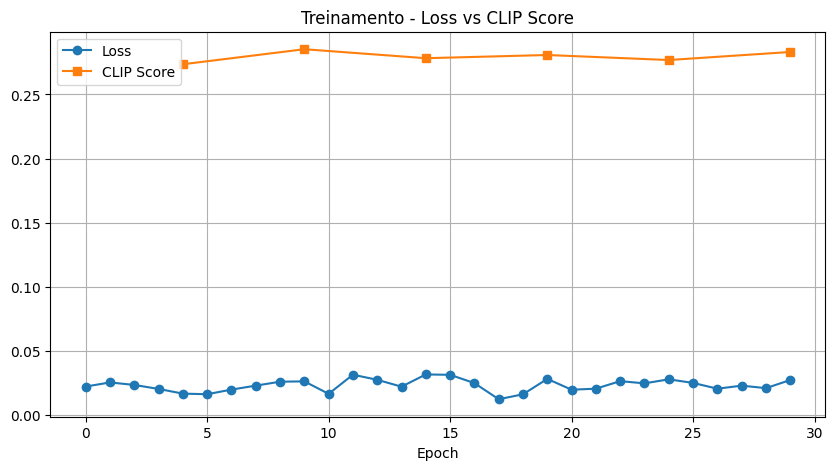

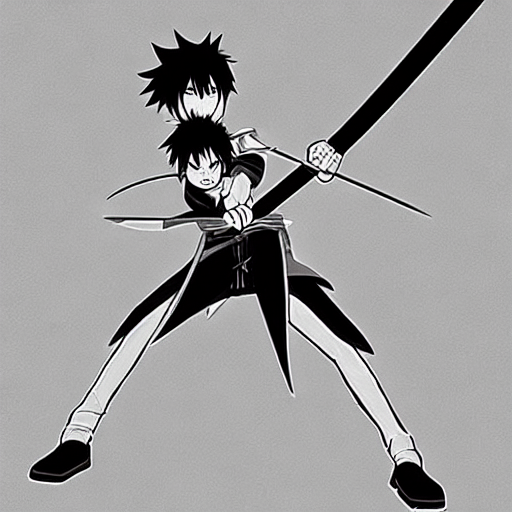

Epoch 5 - CLIP Score: 0.2736


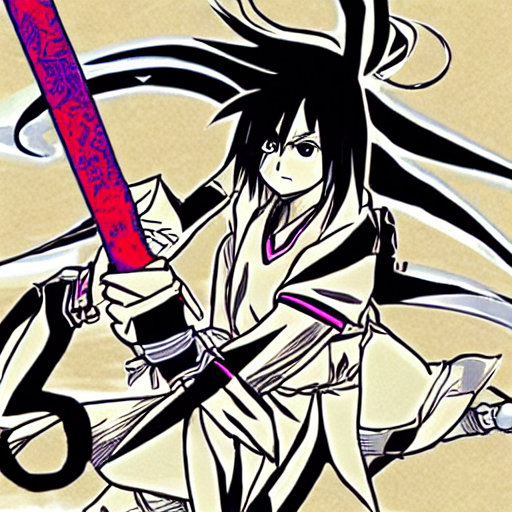

Epoch 10 - CLIP Score: 0.2853


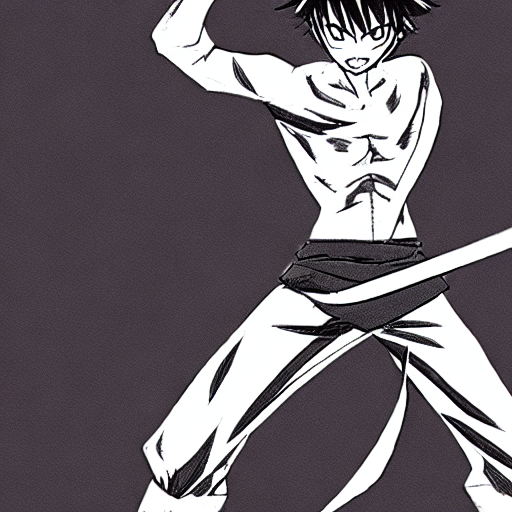

Epoch 15 - CLIP Score: 0.2783


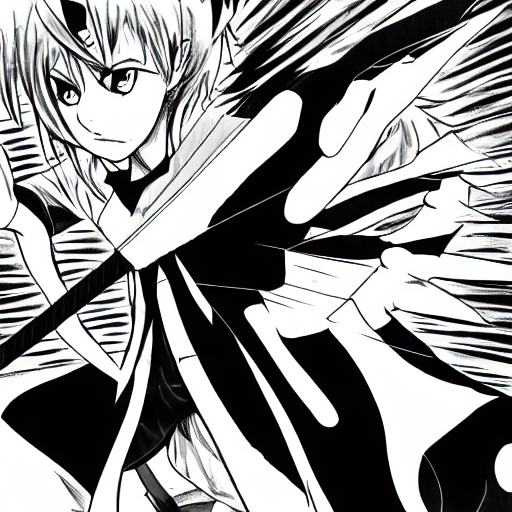

Epoch 20 - CLIP Score: 0.2808


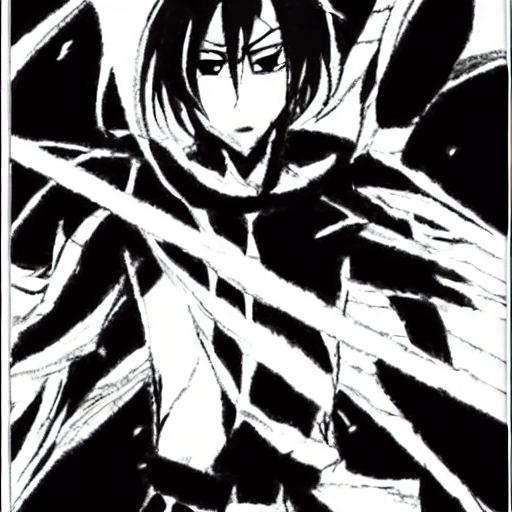

Epoch 25 - CLIP Score: 0.2769


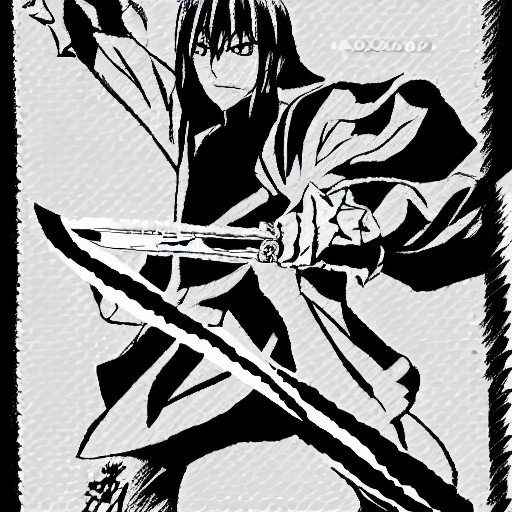

Epoch 30 - CLIP Score: 0.2832


In [ ]:
lora_v2 = LoraConfig(
    r=16, lora_alpha=32,
    target_modules=["to_q", "to_k", "to_v", "to_out.0", "ff.net.0.proj", "ff.net.2"],
    bias="none"
)
train_model(30, "/content/processed_images", "/content/prompts.csv", "lora-kubo-v2", lora_v2)

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16).to(device)
pipe2 = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16).to(device)

# Carrega os pesos LoRA no UNet
pipe.unet = PeftModel.from_pretrained(pipe.unet, "/content/lora-kubo-v1")
pipe2.unet = PeftModel.from_pretrained(pipe2.unet, "/content/lora-kubo-v2")

#CLIP model e tokenizer para calcular clip score
clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

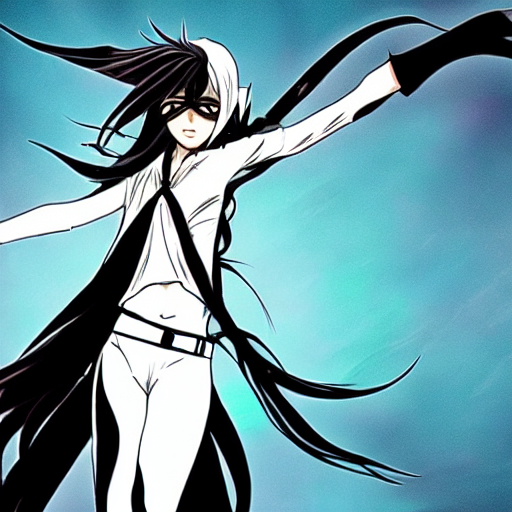

CLIP Score: 0.3534


  0%|          | 0/50 [00:00<?, ?it/s]

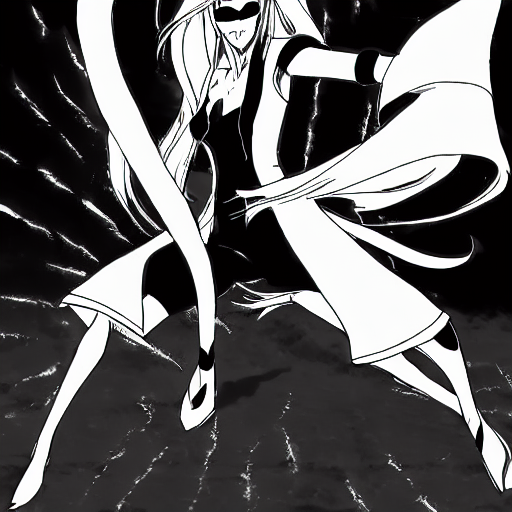

CLIP Score: 0.3241


In [ ]:
prompt = "Female character with white long hair in a dynamic pose, wearing a mask, Tite Kubo style"
image = pipe(prompt).images[0]
clip_score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
display(image)
print(f"CLIP Score: {clip_score:.4f}")
image = pipe2(prompt).images[0]
clip_score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
display(image)
print(f"CLIP Score: {clip_score:.4f}")

  0%|          | 0/50 [00:00<?, ?it/s]

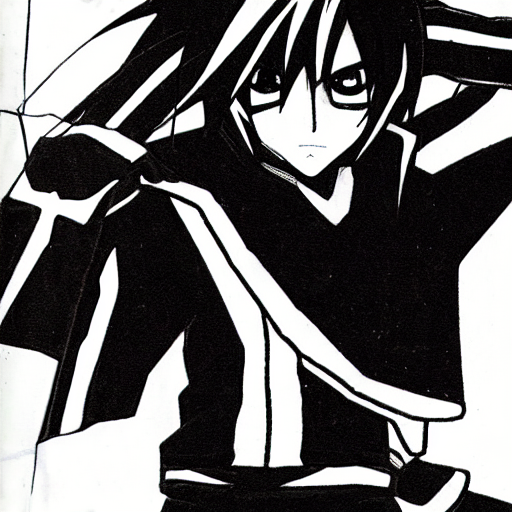

CLIP Score: 0.2666


  0%|          | 0/50 [00:00<?, ?it/s]

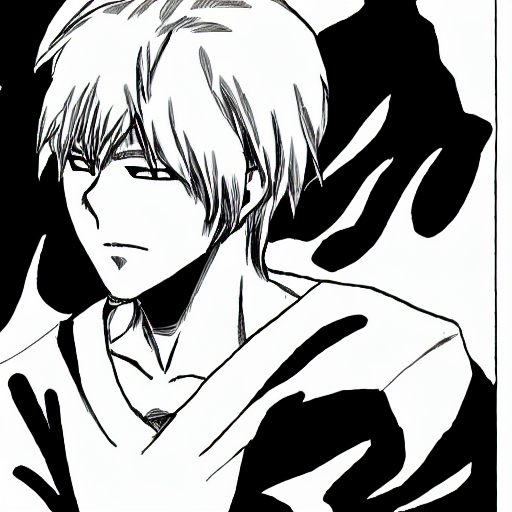

CLIP Score: 0.2703


In [ ]:
prompt = "male manga character half masked, Tite Kubo style"
image = pipe(prompt).images[0]
clip_score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
display(image)
print(f"CLIP Score: {clip_score:.4f}")
image = pipe2(prompt).images[0]
clip_score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
display(image)
print(f"CLIP Score: {clip_score:.4f}")

  0%|          | 0/50 [00:00<?, ?it/s]

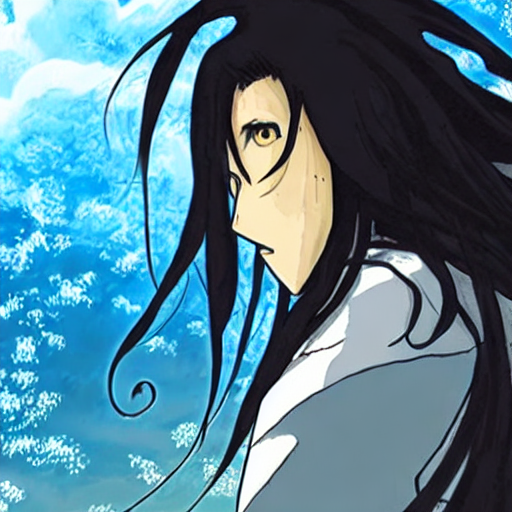

CLIP Score: 0.2596


  0%|          | 0/50 [00:00<?, ?it/s]

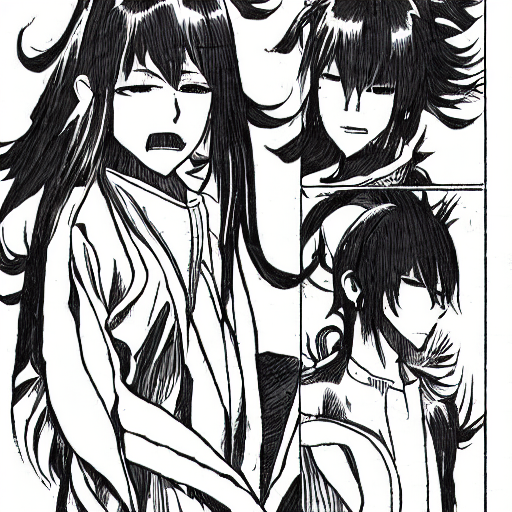

CLIP Score: 0.2566


In [18]:
prompt = "Manga character with long hair emanating power from a hole in their chest, Kubo style"
image = pipe(prompt).images[0]
clip_score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
display(image)
print(f"CLIP Score: {clip_score:.4f}")
image = pipe2(prompt).images[0]
clip_score = evaluate_clip_score(prompt, image, clip_model, tokenizer)
display(image)
print(f"CLIP Score: {clip_score:.4f}")